# Initial

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots 
import plotly.graph_objects as go 
import plotly.express as px

In [34]:
path='drive/MyDrive/Colab Notebooks/Pasiondataset.csv'
dataset = pd.read_csv(path)


In [3]:
print("Different Data types:",dataset.dtypes)

Different Data types: Location          object
Date               int64
Time               int64
Latitude         float64
Longitude        float64
Altitude           int64
YRMODAHRMI       float64
Month              int64
Hour               int64
Season            object
Humidity         float64
AmbientTemp      float64
PolyPwr          float64
Wind.Speed         int64
Visibility       float64
Pressure         float64
Cloud.Ceiling      int64
dtype: object


In [4]:
print("Different Features:",dataset.columns)

Different Features: Index(['Location', 'Date', 'Time', 'Latitude', 'Longitude', 'Altitude',
       'YRMODAHRMI', 'Month', 'Hour', 'Season', 'Humidity', 'AmbientTemp',
       'PolyPwr', 'Wind.Speed', 'Visibility', 'Pressure', 'Cloud.Ceiling'],
      dtype='object')


In [5]:
#grouped = dataset.groupby('Location')
print("Different Locations:", dataset['Location'].unique())

Different Locations: ['Camp Murray' 'Grissom' 'Hill Weber' 'JDMT' 'Kahului' 'Malmstrom'
 'March AFB' 'MNANG' 'Offutt' 'Peterson' 'Travis' 'USAFA']


In [35]:
dataset['New_Date'] = pd.to_datetime(dataset['Date'].astype(str), format='%Y%m%d')
dataset['New_Time'] = pd.to_datetime(dataset['Time'].astype(str), format='%H%M')


In [7]:
dataset.drop(['Date', 'Time'], axis=1, inplace=True)

In [36]:
dataset

,Location,Date,Time,Latitude,Longitude,Altitude,YRMODAHRMI,Month,Hour,Season,Humidity,AmbientTemp,PolyPwr,Wind.Speed,Visibility,Pressure,Cloud.Ceiling,New_Date,New_Time
0,Camp Murray,20171203,1145,47.11,-122.57,84,2.017120e+11,12,11,Winter,81.71997,12.86919,2.42769,5,10.0,1010.6,722,2017-12-03,1900-01-01 11:45:00
1,Camp Murray,20171203,1315,47.11,-122.57,84,2.017120e+11,12,13,Winter,96.64917,9.66415,2.46273,0,10.0,1011.3,23,2017-12-03,1900-01-01 13:15:00
2,Camp Murray,20171203,1330,47.11,-122.57,84,2.017120e+11,12,13,Winter,93.61572,15.44983,4.46836,5,10.0,1011.6,32,2017-12-03,1900-01-01 13:30:00
3,Camp Murray,20171204,1230,47.11,-122.57,84,2.017120e+11,12,12,Winter,77.21558,10.36659,1.65364,5,2.0,1024.4,6,2017-12-04,1900-01-01 12:30:00
4,Camp Murray,20171204,1415,47.11,-122.57,84,2.017120e+11,12,14,Winter,54.80347,16.85471,6.57939,3,3.0,1023.7,9,2017-12-04,1900-01-01 14:15:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21040,USAFA,20180928,1530,38.95,-104.83,1947,2.018090e+11,9,15,Fall,11.66992,43.22510,9.79611,14,10.0,802.3,722,2018-09-28,1900-01-01 15:30:00
21041,USAFA,20180929,1300,38.95,-104.83,1947,2.018090e+11,9,13,Fall,18.22510,28.98247,10.88992,13,10.0,799.2,722,2018-09-29,1900-01-01 13:00:00
21042,USAFA,20180929,1400,38.95,-104.83,1947,2.018090e+11,9,14,Fall,15.52124,33.49167,8.24479,10,10.0,798.4,722,2018-09-29,1900-01-01 14:00:00
21043,USAFA,20180929,1500,38.95,-104.83,1947,2.018090e+11,9,15,Fall,6.63452,51.62163,12.47328,10,10.0,797.8,722,2018-09-29,1900-01-01 15:00:00


In [8]:
unique_locations = dataset['Location'].unique()
'''['Camp Murray' 'Grissom' 'Hill Weber' 'JDMT' 'Kahului' 'Malmstrom'
 'March AFB' 'MNANG' 'Offutt' 'Peterson' 'Travis' 'USAFA']'''

print(unique_locations)


['Camp Murray' 'Grissom' 'Hill Weber' 'JDMT' 'Kahului' 'Malmstrom'
 'March AFB' 'MNANG' 'Offutt' 'Peterson' 'Travis' 'USAFA']


In [37]:
locations= dataset[['Location' ,'Latitude', 'Longitude']]
locations= locations.drop_duplicates(ignore_index=True)
locations

,Location,Latitude,Longitude
0,Camp Murray,47.11,-122.57
1,Grissom,40.67,-86.15
2,Hill Weber,41.15,-111.99
3,JDMT,26.98,-80.11
4,Kahului,20.89,-156.44
5,Malmstrom,47.52,-111.18
6,March AFB,33.90,-117.26
7,MNANG,44.89,-93.20
8,Offutt,41.13,-95.75
9,Peterson,38.82,-104.71


In [10]:
from geopy.geocoders import Nominatim
# initialize Nominatim API 
geolocator = Nominatim(user_agent="geoapiExercises")

for i in unique_locations:
  print(i)

  '''Latitude = locations[i]['Latitude']
  Longitude = locations[i]['Longitude']
  
  place = geolocator.reverse(Latitude+","+Longitude)
  locations['Place']= place'''

Camp Murray
Grissom
Hill Weber
JDMT
Kahului
Malmstrom
March AFB
MNANG
Offutt
Peterson
Travis
USAFA


In [11]:
locations= dataset['Location']

In [12]:
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

# TOP 5 CORRELATIONS FOR EVERY LOCATION

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


Camp Murray
***
Humidity     AmbientTemp      0.989870
AmbientTemp  PolyPwr          0.963379
Humidity     PolyPwr          0.948585
AmbientTemp  Cloud.Ceiling    0.875257
Humidity     Cloud.Ceiling    0.871834
dtype: float64
************************
Grissom
***
AmbientTemp  PolyPwr          0.887595
Humidity     Cloud.Ceiling    0.882767
             PolyPwr          0.832566
PolyPwr      Cloud.Ceiling    0.728934
Humidity     AmbientTemp      0.715247
dtype: float64
************************
Hill Weber
***
Humidity     AmbientTemp      0.970093
AmbientTemp  PolyPwr          0.924767
Humidity     PolyPwr          0.910839
             Cloud.Ceiling    0.863462
AmbientTemp  Cloud.Ceiling    0.787293
dtype: float64
************************
JDMT
***
Humidity     PolyPwr          0.855037
             AmbientTemp      0.821411
             Cloud.Ceiling    0.805520
AmbientTemp  PolyPwr          0.757544
PolyPwr      Cloud.Ceiling    0.645456
dtype: float64
************************
Kahului


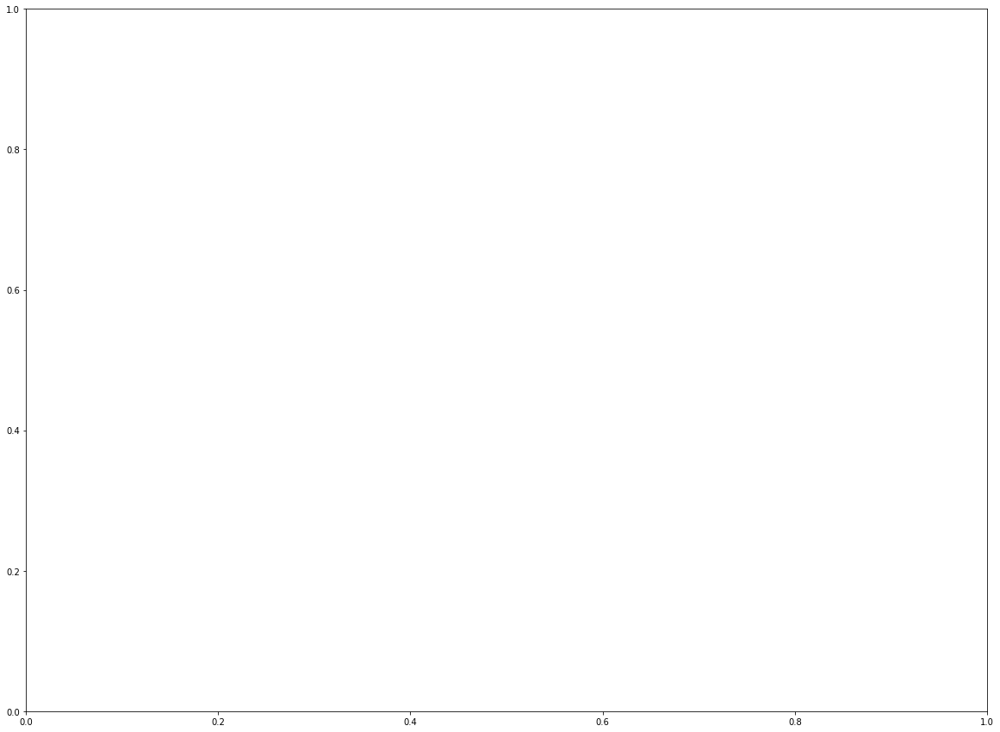

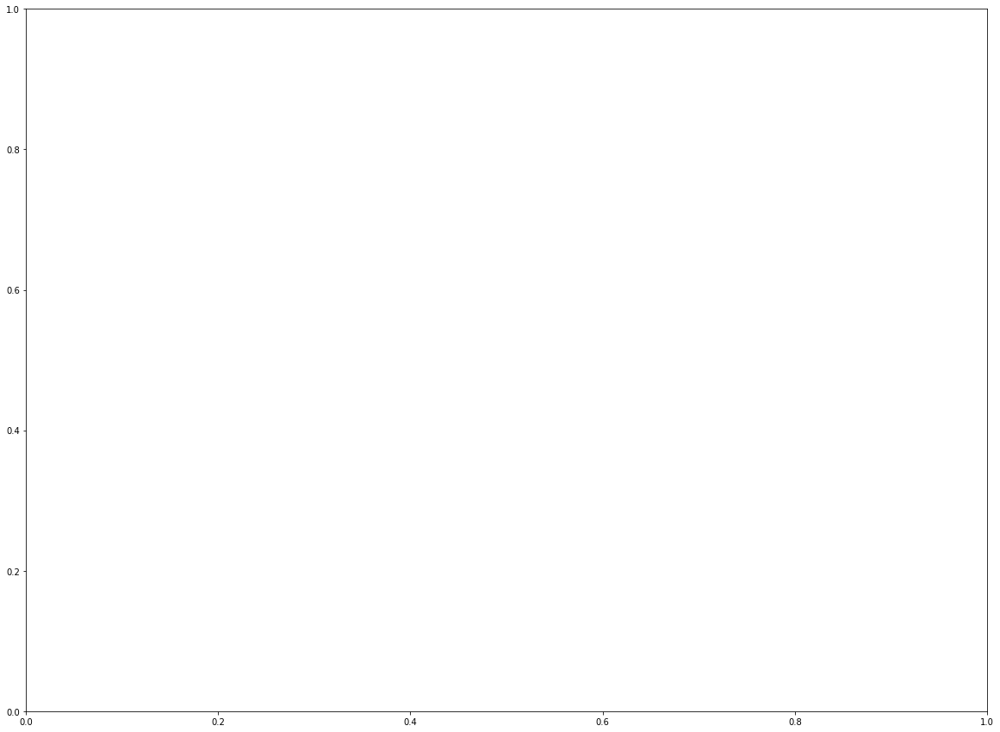

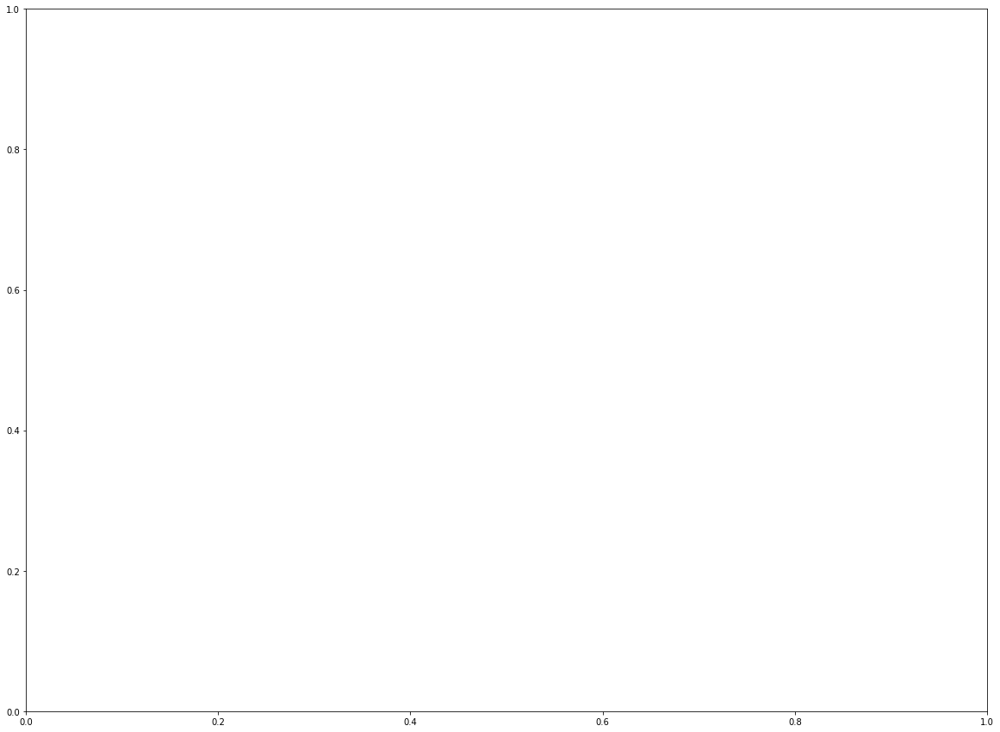

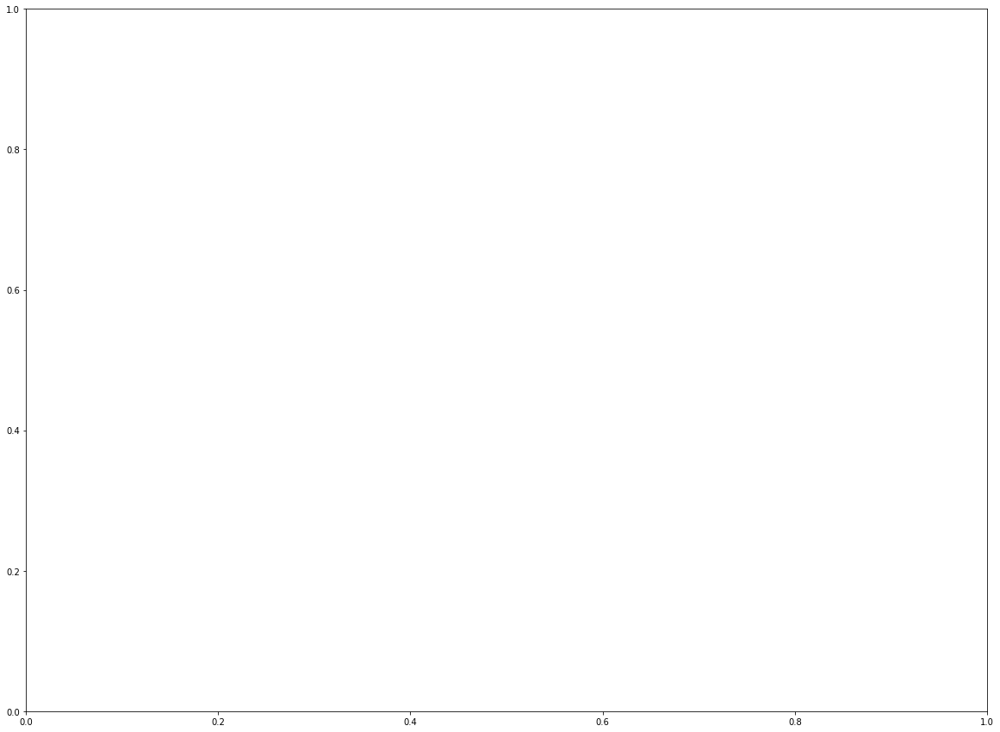

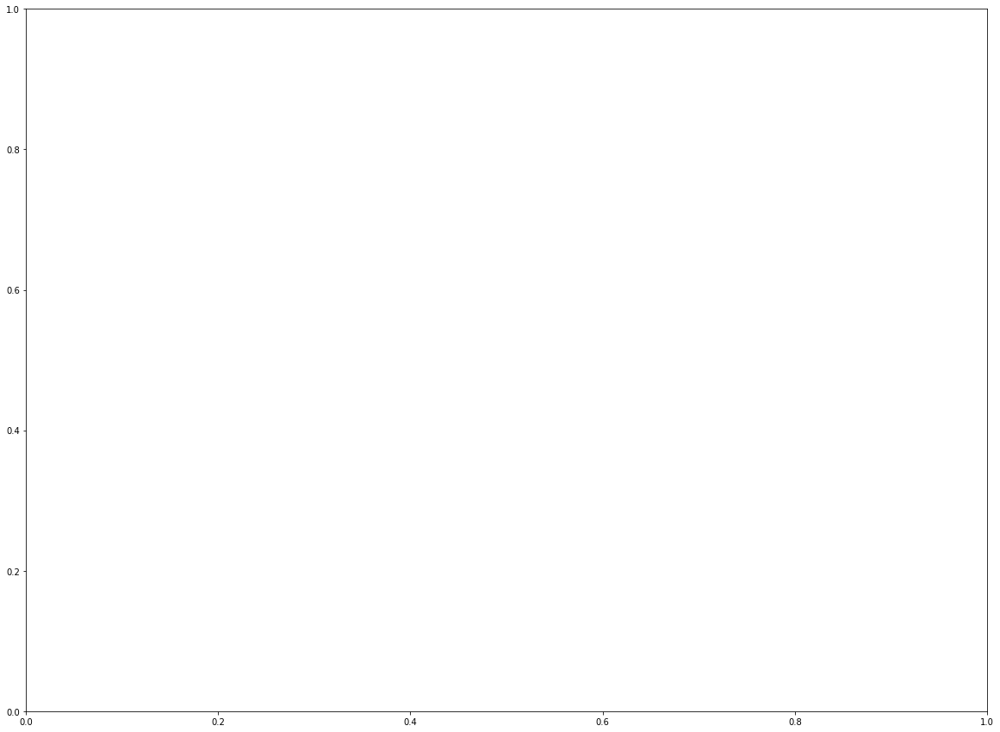

...

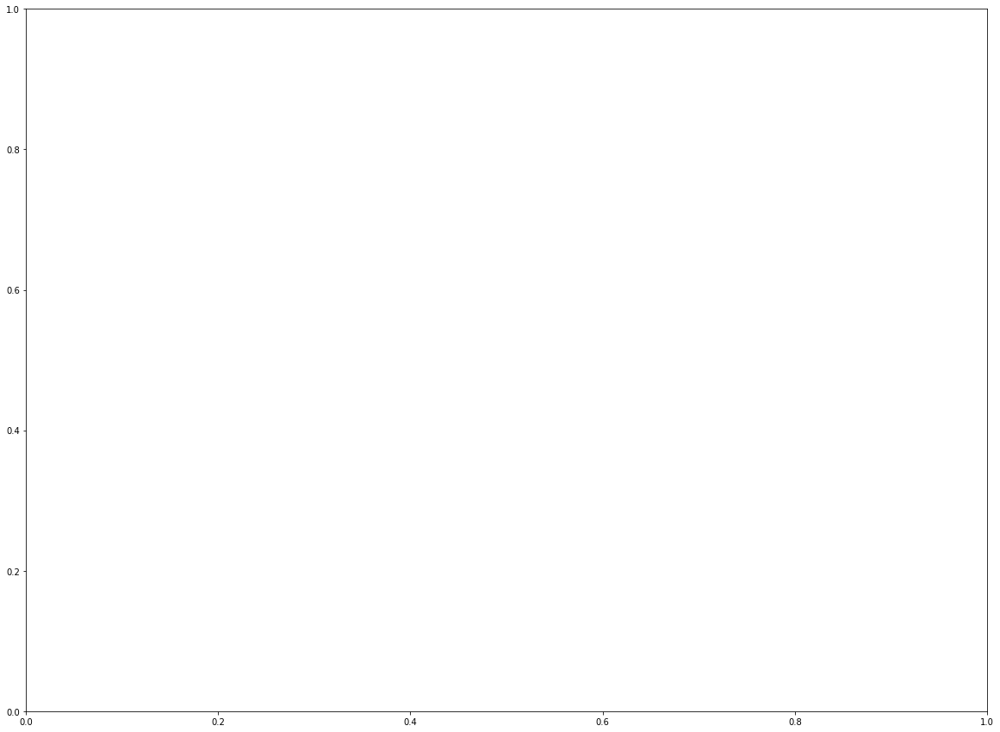

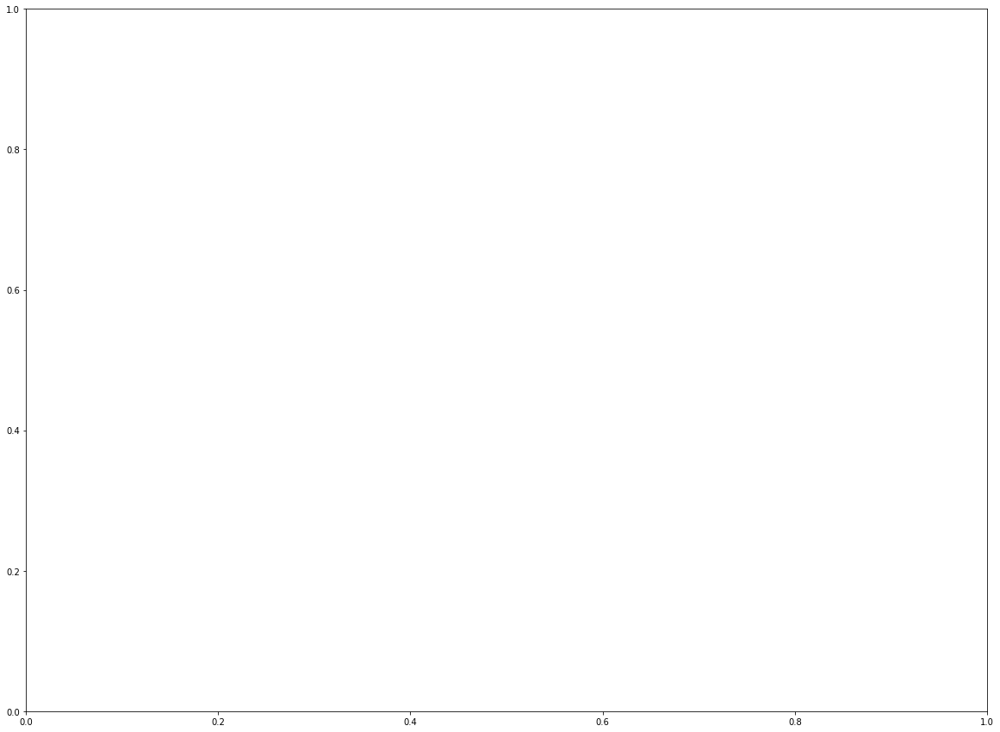

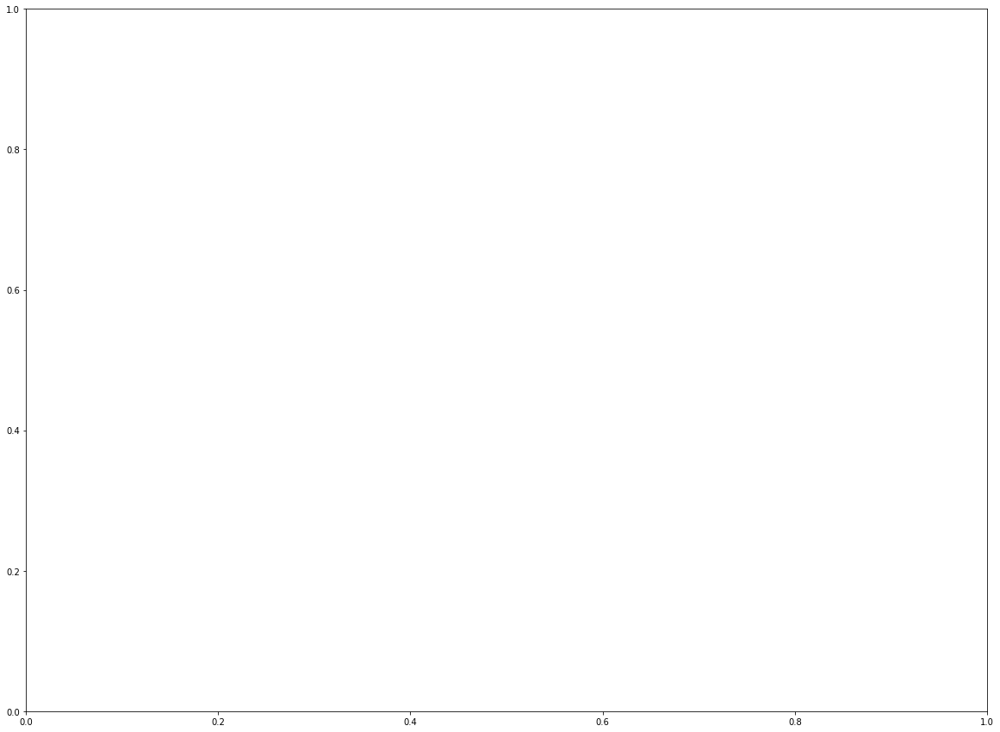

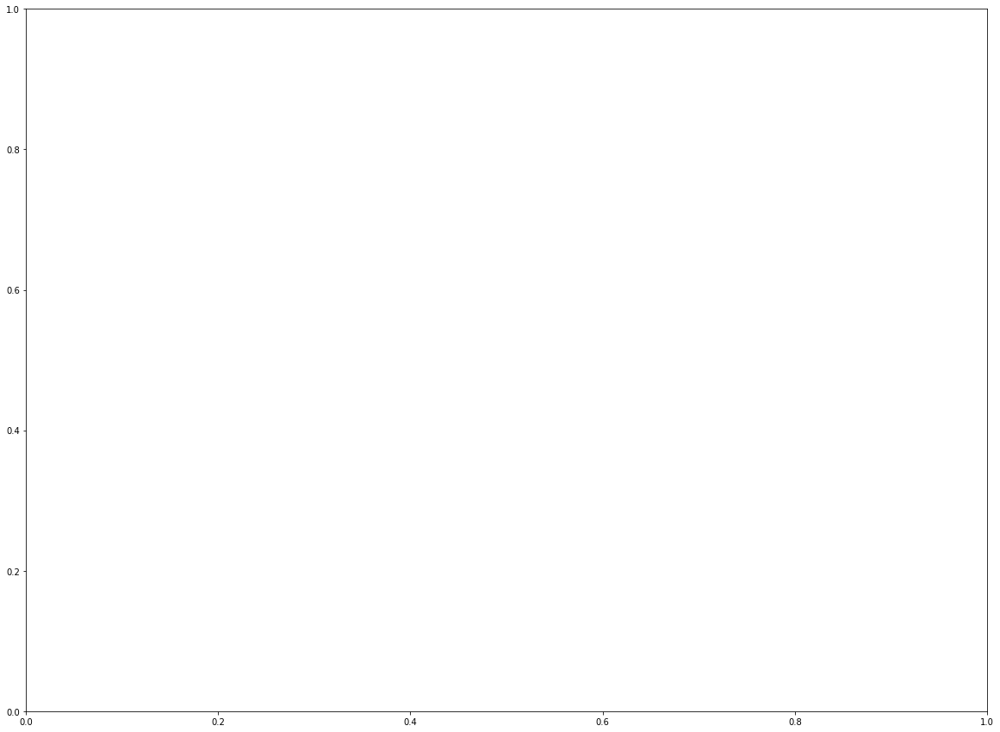

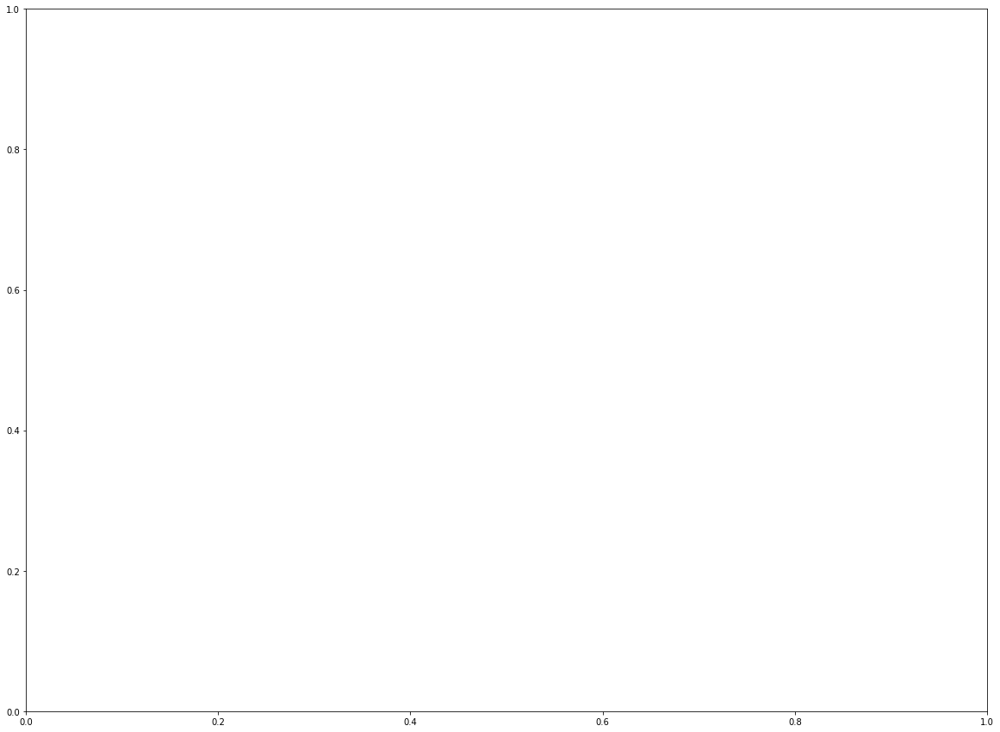

In [14]:
for loc in unique_locations:
    loc_df = dataset.loc[dataset['Location'] == loc]
    loc_df.drop(['Location', 'Longitude', 'Latitude','YRMODAHRMI'], axis=1, inplace=True)
    loc_df_corr=loc_df.corr()
    plt.subplots(figsize=(20,15))
    print(loc)
    print("***")
    print(get_top_abs_correlations(loc_df_corr))
    print("************************")


# Camp Murray

In [15]:
CampMurray_df = dataset.loc[dataset['Location'] == 'Camp Murray']
CampMurray_df

,Location,Latitude,Longitude,Altitude,YRMODAHRMI,Month,Hour,Season,Humidity,AmbientTemp,PolyPwr,Wind.Speed,Visibility,Pressure,Cloud.Ceiling,New_Date,New_Time
0,Camp Murray,47.11,-122.57,84,2.017120e+11,12,11,Winter,81.71997,12.86919,2.42769,5,10.0,1010.6,722,2017-12-03,1900-01-01 11:45:00
1,Camp Murray,47.11,-122.57,84,2.017120e+11,12,13,Winter,96.64917,9.66415,2.46273,0,10.0,1011.3,23,2017-12-03,1900-01-01 13:15:00
2,Camp Murray,47.11,-122.57,84,2.017120e+11,12,13,Winter,93.61572,15.44983,4.46836,5,10.0,1011.6,32,2017-12-03,1900-01-01 13:30:00
3,Camp Murray,47.11,-122.57,84,2.017120e+11,12,12,Winter,77.21558,10.36659,1.65364,5,2.0,1024.4,6,2017-12-04,1900-01-01 12:30:00
4,Camp Murray,47.11,-122.57,84,2.017120e+11,12,14,Winter,54.80347,16.85471,6.57939,3,3.0,1023.7,9,2017-12-04,1900-01-01 14:15:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1108,Camp Murray,47.11,-122.57,84,2.018100e+11,10,10,Fall,44.53125,24.54376,8.44510,8,10.0,997.8,36,2018-10-02,1900-01-01 10:00:00
1109,Camp Murray,47.11,-122.57,84,2.018100e+11,10,11,Fall,47.20459,21.88255,2.60391,13,10.0,997.5,41,2018-10-02,1900-01-01 11:00:00
1110,Camp Murray,47.11,-122.57,84,2.018100e+11,10,13,Fall,64.55688,16.75148,2.99080,8,10.0,997.5,29,2018-10-02,1900-01-01 13:15:00
1111,Camp Murray,47.11,-122.57,84,2.018100e+11,10,14,Fall,92.59033,14.79774,2.81487,11,10.0,997.5,33,2018-10-02,1900-01-01 14:30:00


In [20]:
CampMurray_df.drop(['Location', 'Longitude', 'Latitude','YRMODAHRMI'], axis=1, inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [21]:
CampMurray_df

,Altitude,Month,Hour,Season,Humidity,AmbientTemp,PolyPwr,Wind.Speed,Visibility,Pressure,Cloud.Ceiling,New_Date,New_Time
0,84,12,11,Winter,81.71997,12.86919,2.42769,5,10.0,1010.6,722,2017-12-03,1900-01-01 11:45:00
1,84,12,13,Winter,96.64917,9.66415,2.46273,0,10.0,1011.3,23,2017-12-03,1900-01-01 13:15:00
2,84,12,13,Winter,93.61572,15.44983,4.46836,5,10.0,1011.6,32,2017-12-03,1900-01-01 13:30:00
3,84,12,12,Winter,77.21558,10.36659,1.65364,5,2.0,1024.4,6,2017-12-04,1900-01-01 12:30:00
4,84,12,14,Winter,54.80347,16.85471,6.57939,3,3.0,1023.7,9,2017-12-04,1900-01-01 14:15:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1108,84,10,10,Fall,44.53125,24.54376,8.44510,8,10.0,997.8,36,2018-10-02,1900-01-01 10:00:00
1109,84,10,11,Fall,47.20459,21.88255,2.60391,13,10.0,997.5,41,2018-10-02,1900-01-01 11:00:00
1110,84,10,13,Fall,64.55688,16.75148,2.99080,8,10.0,997.5,29,2018-10-02,1900-01-01 13:15:00
1111,84,10,14,Fall,92.59033,14.79774,2.81487,11,10.0,997.5,33,2018-10-02,1900-01-01 14:30:00


In [23]:
CampMurray_df_corr=CampMurray_df.corr()
CampMurray_df_corr

,Altitude,Month,Hour,Humidity,AmbientTemp,PolyPwr,Wind.Speed,Visibility,Pressure,Cloud.Ceiling
Altitude,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Month,NaN,1.000000,-0.060376,-0.331249,0.437364,0.249526,-0.134703,-0.058889,0.145335,0.248029
Hour,NaN,-0.060376,1.000000,-0.245531,0.279514,0.138916,0.209793,-0.021199,-0.043556,0.078644
Humidity,NaN,-0.331249,-0.245531,1.000000,-0.889665,-0.706716,0.072914,-0.161624,-0.050662,-0.556940
AmbientTemp,NaN,0.437364,0.279514,-0.889665,1.000000,0.785855,-0.036357,0.172640,-0.094077,0.594719
PolyPwr,NaN,0.249526,0.138916,-0.706716,0.785855,1.000000,-0.018228,0.206784,-0.134374,0.479792
Wind.Speed,NaN,-0.134703,0.209793,0.072914,-0.036357,-0.018228,1.000000,0.184879,-0.254655,-0.032295
Visibility,NaN,-0.058889,-0.021199,-0.161624,0.172640,0.206784,0.184879,1.000000,-0.098542,0.065115
Pressure,NaN,0.145335,-0.043556,-0.050662,-0.094077,-0.134374,-0.254655,-0.098542,1.000000,-0.055662
Cloud.Ceiling,NaN,0.248029,0.078644,-0.556940,0.594719,0.479792,-0.032295,0.065115,-0.055662,1.000000


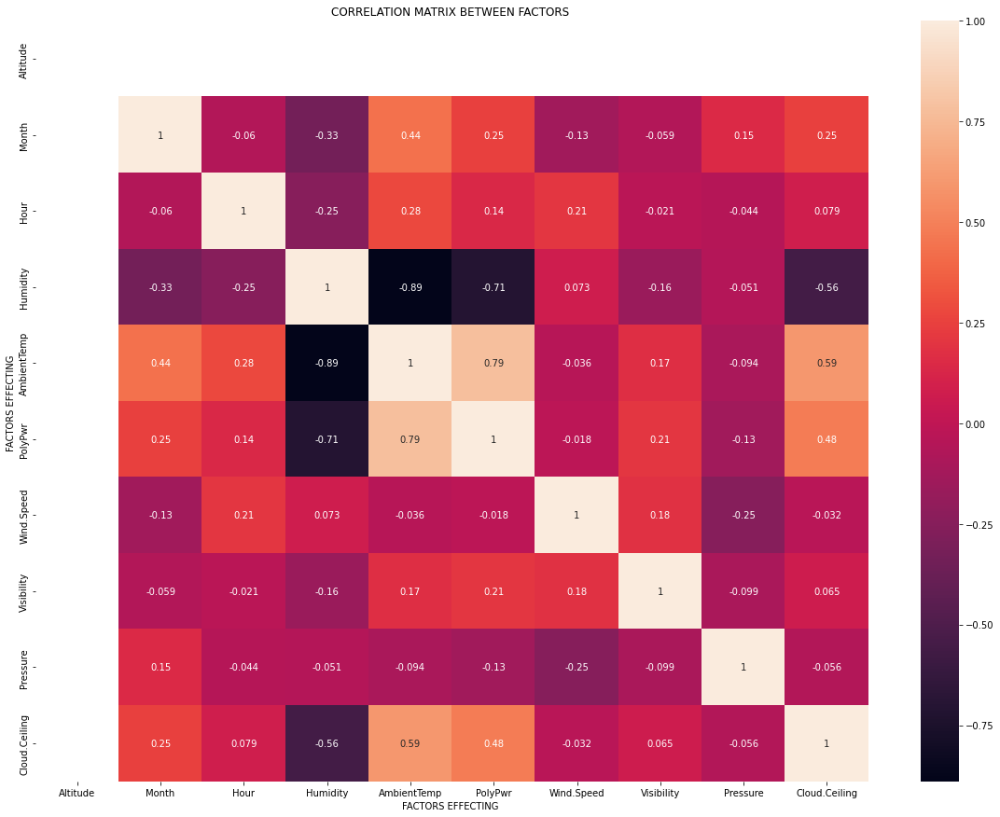

In [24]:
plt.subplots(figsize=(20,15))
sns.heatmap(CampMurray_df_corr,annot=True)
plt.title("CORRELATION MATRIX BETWEEN FACTORS ")
plt.xlabel("FACTORS EFFECTING ")
plt.ylabel("FACTORS EFFECTING ")
plt.show()

In [27]:
get_top_abs_correlations(CampMurray_df_corr)

Humidity     AmbientTemp      0.989870
AmbientTemp  PolyPwr          0.963379
Humidity     PolyPwr          0.948585
AmbientTemp  Cloud.Ceiling    0.875257
Humidity     Cloud.Ceiling    0.871834
dtype: float64

# Grissom

In [48]:
Grissom_df = dataset.loc[dataset['Location'] == 'Grissom']
Grissom_df

,Location,Latitude,Longitude,Altitude,YRMODAHRMI,Month,Hour,Season,Humidity,AmbientTemp,PolyPwr,Wind.Speed,Visibility,Pressure,Cloud.Ceiling,New_Date,New_Time
1113,Grissom,40.67,-86.15,239,2.017110e+11,11,11,Fall,62.78076,11.00609,4.14981,16,10.0,994.4,140,2017-11-07,1900-01-01 11:00:00
1114,Grissom,40.67,-86.15,239,2.017110e+11,11,11,Fall,62.26807,10.93307,3.76511,17,10.0,994.4,722,2017-11-07,1900-01-01 11:30:00
1115,Grissom,40.67,-86.15,239,2.017110e+11,11,12,Fall,41.02173,18.06824,7.24524,16,10.0,994.4,722,2017-11-07,1900-01-01 12:00:00
1116,Grissom,40.67,-86.15,239,2.017110e+11,11,13,Fall,40.58228,17.43378,3.71336,17,10.0,994.1,722,2017-11-07,1900-01-01 13:00:00
1117,Grissom,40.67,-86.15,239,2.017110e+11,11,14,Fall,50.40283,13.55904,6.49851,11,10.0,994.4,32,2017-11-07,1900-01-01 14:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2595,Grissom,40.67,-86.15,239,2.018100e+11,10,15,Fall,37.12158,37.35886,8.44588,22,10.0,983.2,722,2018-10-03,1900-01-01 15:00:00
2596,Grissom,40.67,-86.15,239,2.018100e+11,10,10,Fall,79.20532,20.60356,3.18460,13,10.0,987.8,21,2018-10-04,1900-01-01 10:30:00
2597,Grissom,40.67,-86.15,239,2.018100e+11,10,11,Fall,75.14038,21.25816,3.04796,13,10.0,988.2,22,2018-10-04,1900-01-01 11:00:00
2598,Grissom,40.67,-86.15,239,2.018100e+11,10,13,Fall,42.79175,29.68742,10.55385,16,10.0,989.2,28,2018-10-04,1900-01-01 13:00:00


In [49]:
Grissom_df.drop(['Location', 'Longitude', 'Latitude','YRMODAHRMI'], axis=1, inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [50]:
Grissom_df

,Altitude,Month,Hour,Season,Humidity,AmbientTemp,PolyPwr,Wind.Speed,Visibility,Pressure,Cloud.Ceiling,New_Date,New_Time
1113,239,11,11,Fall,62.78076,11.00609,4.14981,16,10.0,994.4,140,2017-11-07,1900-01-01 11:00:00
1114,239,11,11,Fall,62.26807,10.93307,3.76511,17,10.0,994.4,722,2017-11-07,1900-01-01 11:30:00
1115,239,11,12,Fall,41.02173,18.06824,7.24524,16,10.0,994.4,722,2017-11-07,1900-01-01 12:00:00
1116,239,11,13,Fall,40.58228,17.43378,3.71336,17,10.0,994.1,722,2017-11-07,1900-01-01 13:00:00
1117,239,11,14,Fall,50.40283,13.55904,6.49851,11,10.0,994.4,32,2017-11-07,1900-01-01 14:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2595,239,10,15,Fall,37.12158,37.35886,8.44588,22,10.0,983.2,722,2018-10-03,1900-01-01 15:00:00
2596,239,10,10,Fall,79.20532,20.60356,3.18460,13,10.0,987.8,21,2018-10-04,1900-01-01 10:30:00
2597,239,10,11,Fall,75.14038,21.25816,3.04796,13,10.0,988.2,22,2018-10-04,1900-01-01 11:00:00
2598,239,10,13,Fall,42.79175,29.68742,10.55385,16,10.0,989.2,28,2018-10-04,1900-01-01 13:00:00


In [51]:
Grissom_df_corr=Grissom_df.corr()
Grissom_df_corr

,Altitude,Month,Hour,Humidity,AmbientTemp,PolyPwr,Wind.Speed,Visibility,Pressure,Cloud.Ceiling
Altitude,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Month,NaN,1.000000,0.024741,-0.107767,0.023498,-0.105660,0.016444,0.158685,0.027269,0.115408
Hour,NaN,0.024741,1.000000,-0.235620,0.123732,0.166752,0.133097,-0.051258,-0.080440,-0.044511
Humidity,NaN,-0.107767,-0.235620,1.000000,-0.443304,-0.568796,0.063790,-0.363520,-0.319378,-0.613554
AmbientTemp,NaN,0.023498,0.123732,-0.443304,1.000000,0.635155,-0.284656,0.254262,-0.187831,0.347717
PolyPwr,NaN,-0.105660,0.166752,-0.568796,0.635155,1.000000,-0.090949,0.215425,0.005016,0.435134
Wind.Speed,NaN,0.016444,0.133097,0.063790,-0.284656,-0.090949,1.000000,0.068669,-0.240404,-0.128641
Visibility,NaN,0.158685,-0.051258,-0.363520,0.254262,0.215425,0.068669,1.000000,0.024122,0.250942
Pressure,NaN,0.027269,-0.080440,-0.319378,-0.187831,0.005016,-0.240404,0.024122,1.000000,0.258281
Cloud.Ceiling,NaN,0.115408,-0.044511,-0.613554,0.347717,0.435134,-0.128641,0.250942,0.258281,1.000000


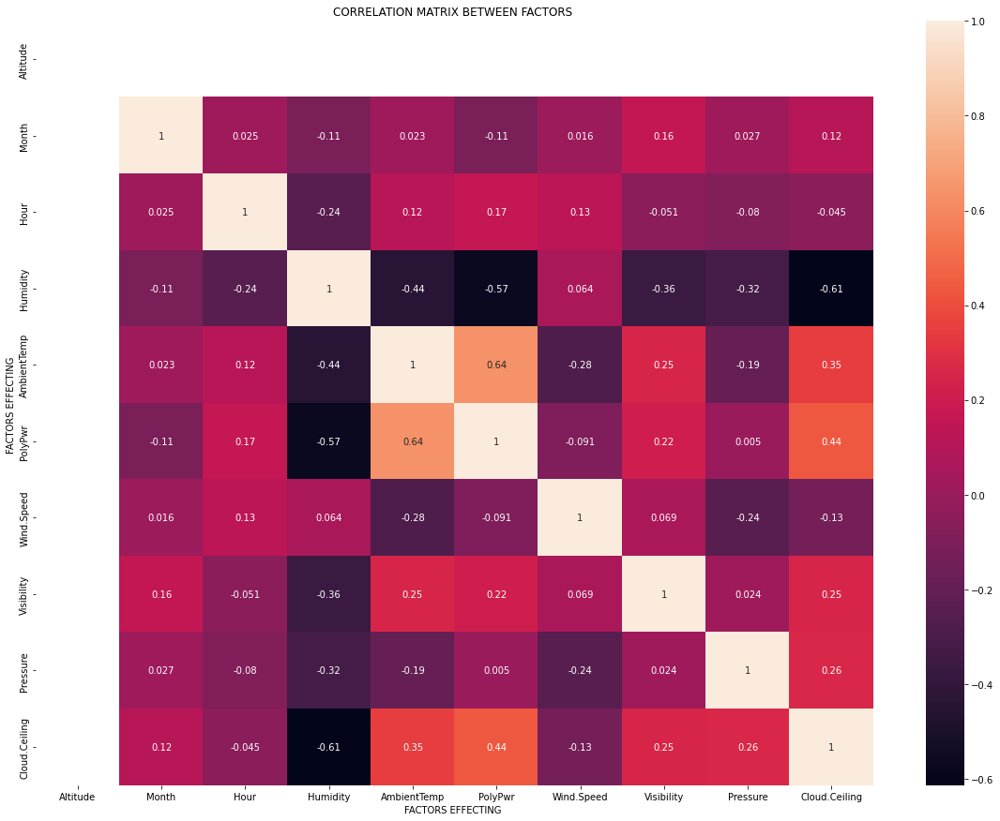

In [52]:
plt.subplots(figsize=(20,15))
sns.heatmap(Grissom_df_corr,annot=True)
plt.title("CORRELATION MATRIX BETWEEN FACTORS ")
plt.xlabel("FACTORS EFFECTING ")
plt.ylabel("FACTORS EFFECTING ")
plt.show()

In [54]:
get_top_abs_correlations(Grissom_df_corr)

AmbientTemp  PolyPwr          0.887595
Humidity     Cloud.Ceiling    0.882767
             PolyPwr          0.832566
PolyPwr      Cloud.Ceiling    0.728934
Humidity     AmbientTemp      0.715247
dtype: float64

# Basic Plots

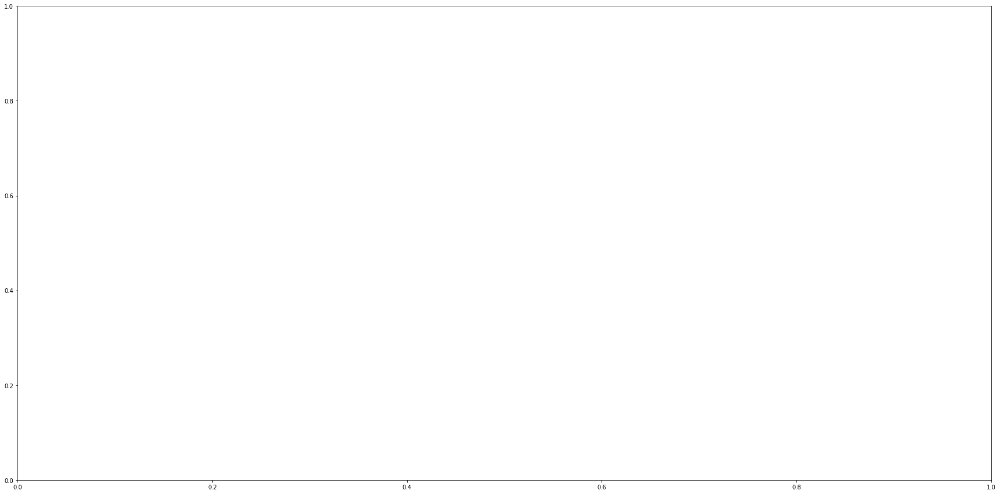

In [15]:
fig, ax = plt.subplots(figsize=(30,15))
for loc in unique_locations:
    loc_df = dataset.loc[dataset['Location'] == loc]
    loc_grouped_df = dataset.groupby('New_Date', as_index=False)['PolyPwr'].mean()
    fig = make_subplots(rows=2, cols=2,
                    subplot_titles=("Humidity", "AmbientTemp", "PolyPwr", "Wind.Speed")) 
    fig.add_trace( go.Scatter(x=loc_df['New_Date'],y=loc_df['Humidity'], name="Humidity of "+loc ), row=1, col=1) 
    fig.add_trace( go.Scatter(x=loc_df['New_Date'],y=loc_df['AmbientTemp'],name="AmbientTemp of "+loc), row=1, col=2 ) 
    fig.add_trace( go.Scatter(x=loc_df['New_Date'],y=loc_df['PolyPwr'],name="Power of "+loc), row=2, col=1 ) 
    fig.add_trace( go.Scatter(x=loc_df['New_Date'],y=loc_df['Wind.Speed'],name="Wind Speed of "+loc), row=2, col=2 ) 

    #fig.update_xaxes(title_text="minimum value", row=1, col=1)
    fig.update_layout(height=600, width=1200, title_text=loc) 

    fig.show() 



# New Section

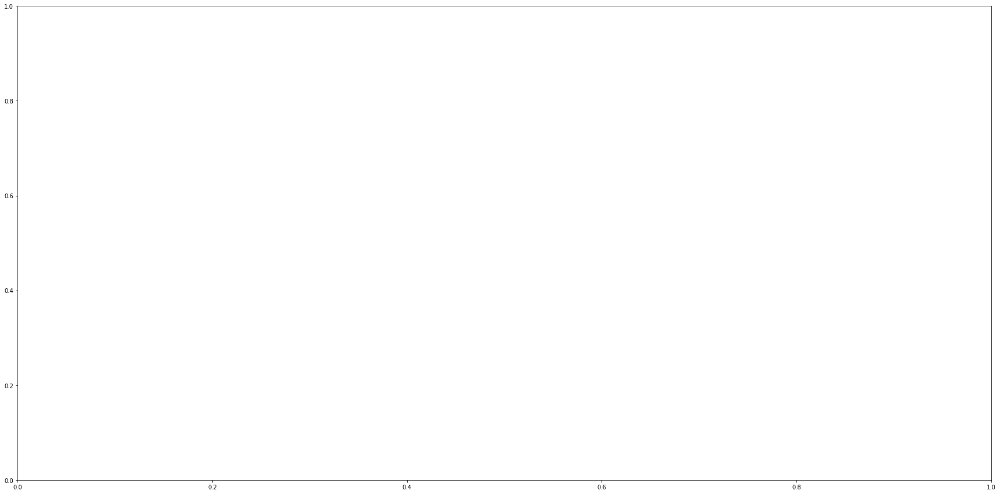

In [16]:
features = ['Humidity', 'AmbientTemp', 'PolyPwr', 'Wind.Speed', 'Visibility', 'Pressure', 'Cloud.Ceiling']

fig, ax = plt.subplots(figsize=(30,15))
for loc in unique_locations:
  loc_df = dataset.loc[dataset['Location'] == loc]
  for f in features:
    fig = make_subplots(rows=1, cols=1,
                    subplot_titles=(f)) 
    fig.add_trace( go.Scatter(x=loc_df['New_Date'],y=loc_df[f], name=f+loc ), row=1, col=1)
    
    #fig.update_xaxes(title_text="minimum value", row=1, col=1)
    fig.update_layout(height=600, width=1200, title_text=loc) 

    fig.show() 


Diffeerent properties at different locations

In [17]:
for f in features:
  fig = make_subplots(rows=1, cols=1,subplot_titles=(f)) 
  fig = px.line(dataset, x="New_Date", y=f, color='Location')
  fig.show()
  fig.update_layout(height=600, width=1200, title_text=loc) 
  fig.show() 

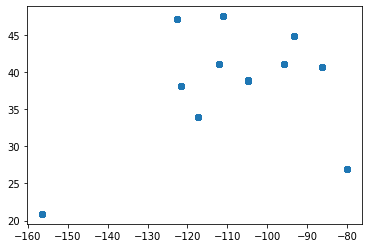

In [18]:
plt.scatter(x=dataset['Longitude'], y=dataset['Latitude'])
plt.show()

# TSA

In [75]:
from statsmodels.tsa.seasonal import seasonal_decompose


In [77]:
# Perform additive decomposition
decomp = seasonal_decompose(dataset2['PolyPwr'])
# Plot decomposition
decomp.plot();
plt.tight_layout();

AttributeError: ignored

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

# Create figure and subplot
fig, ax1 = plt.subplots()

# Plot the ACF on ax1
plot_acf(water['water_consumers'], lags=25, zero=False, ax=ax1);

# FBPROPHET

In [19]:
from fbprophet import Prophet
from fbprophet.plot import plot_cross_validation_metric
from fbprophet.diagnostics import cross_validation, performance_metrics

In [20]:
dataset2=dataset

In [21]:
dataset2.drop(['Longitude', 'Latitude','YRMODAHRMI'], axis=1, inplace=True)

In [22]:
dataset2.dtypes

Location                 object
Altitude                  int64
Month                     int64
Hour                      int64
Season                   object
Humidity                float64
AmbientTemp             float64
PolyPwr                 float64
Wind.Speed                int64
Visibility              float64
Pressure                float64
Cloud.Ceiling             int64
New_Date         datetime64[ns]
New_Time         datetime64[ns]
dtype: object

In [28]:
# MAPE

i=0
for loc in unique_locations:
    loc_df = dataset2.loc[dataset2['Location'] == loc]
    prophet_data= dataset2[['New_Date','PolyPwr']]
    prophet_data=prophet_data.rename(columns={"New_Date": "ds", "PolyPwr": "y"})
    #print(prophet_data)
    m = Prophet()
    print(i, "." , loc)
    print("********")
    m.fit(prophet_data)
    future = m.make_future_dataframe(periods=10)
    print(future.tail())
    forecast = m.predict(future)
    print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())
    #fig1 = m.plot(forecast)
    #fig2 = m.plot_components(forecast)
    df_cv = cross_validation(m, horizon='90 days')
    df_p = performance_metrics(df_cv)
    print(df_p.head(5))
    fig3 = plot_cross_validation_metric(df_cv, metric='mape')
    i=i+1



INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


0 . Camp Murray
********
            ds
505 2018-10-10
506 2018-10-11
507 2018-10-12
508 2018-10-13
509 2018-10-14
            ds       yhat  yhat_lower  yhat_upper
505 2018-10-10  10.192052    2.146538   17.708603
506 2018-10-11  10.062435    1.362147   18.309188
507 2018-10-12   9.582124    1.272554   17.812876
508 2018-10-13   9.730723    1.705214   17.935202
509 2018-10-14   9.817927    1.651546   18.735089


INFO:fbprophet:Making 4 forecasts with cutoffs between 2018-02-21 00:00:00 and 2018-07-06 00:00:00


  0%|          | 0/4 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
# RMSE

i=1
for loc in unique_locations:
    loc_df = dataset2.loc[dataset2['Location'] == loc]
    prophet_data= loc_df[['New_Date','PolyPwr']]
    prophet_data=prophet_data.rename(columns={"New_Date": "ds", "PolyPwr": "y"})
    #print(prophet_data)
    m = Prophet()
    print(i,".",loc)
    print("********")
    m.fit(prophet_data)
    future = m.make_future_dataframe(periods=10)
    #print(future.tail())
    forecast = m.predict(future)
    #print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())
    fig1 = m.plot(forecast)
    #fig2 = m.plot_components(forecast)
    df_cv = cross_validation(m, horizon='30 days')
    df_p = performance_metrics(df_cv)
    print("Minimum RMSE",df_p['rmse'].min())
    print(df_p.head(5))
    fig3 = plot_cross_validation_metric(df_cv, metric='rmse')
    #fig3.show()
    i=i+1
    


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


1 . Camp Murray
********


INFO:fbprophet:Making 13 forecasts with cutoffs between 2018-03-06 00:00:00 and 2018-09-02 00:00:00


  0%|          | 0/13 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/fbprophet/plot.py:526: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.

/usr/local/lib/python3.7/dist-packages/fbprophet/plot.py:527: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Minimum RMSE 5.57938627314787
  horizon        mse      rmse       mae      mape     mdape  coverage
0  4 days  31.437659  5.606930  4.553362  0.591690  0.237571  0.694651
1  5 days  41.719218  6.459042  5.251249  0.717195  0.299464  0.625000
2  6 days  49.752692  7.053559  5.880762  0.780309  0.326511  0.569794
3  7 days  57.993449  7.615343  6.502330  0.836247  0.386827  0.509742
4  8 days  65.140077  8.070940  6.888875  1.061311  0.388735  0.497090
2 . Grissom
********


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-02-06 00:00:00 and 2018-09-04 00:00:00


  0%|          | 0/15 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/fbprophet/plot.py:526: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.

/usr/local/lib/python3.7/dist-packages/fbprophet/plot.py:527: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Minimum RMSE 6.983650919371502
  horizon        mse      rmse       mae      mape     mdape  coverage
0  3 days  50.705885  7.120806  6.049437  1.344393  0.447047  0.490821
1  4 days  48.771380  6.983651  5.939607  1.279684  0.440903  0.520000
2  5 days  52.675208  7.257769  6.156973  1.417206  0.439831  0.491826
3  6 days  53.121711  7.288464  6.185992  1.415166  0.448303  0.493043
4  7 days  53.756107  7.331856  6.183426  1.255267  0.441206  0.492713
3 . Hill Weber
********


INFO:fbprophet:Making 24 forecasts with cutoffs between 2017-09-24 00:00:00 and 2018-09-04 00:00:00


  0%|          | 0/24 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/fbprophet/plot.py:526: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.

/usr/local/lib/python3.7/dist-packages/fbprophet/plot.py:527: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Minimum RMSE 6.102229686978958
  horizon        mse      rmse       mae      mape     mdape  coverage
0  3 days  47.067854  6.860602  5.618804  0.672564  0.365750  0.692797
1  4 days  42.129492  6.490724  5.337238  0.652534  0.373558  0.716444
2  5 days  41.250466  6.422653  5.192741  0.609557  0.372304  0.733317
3  6 days  39.349662  6.272931  5.038003  0.711465  0.375404  0.739714
4  7 days  38.848306  6.232841  4.976051  0.721743  0.375327  0.741820
4 . JDMT
********


INFO:fbprophet:Making 17 forecasts with cutoffs between 2017-08-27 00:00:00 and 2018-04-24 00:00:00


  0%|          | 0/17 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/fbprophet/plot.py:526: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.

/usr/local/lib/python3.7/dist-packages/fbprophet/plot.py:527: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Minimum RMSE 6.648190963606177
  horizon        mse      rmse       mae      mape     mdape  coverage
0  4 days  47.400297  6.884787  5.773110  0.466244  0.247563  0.861116
1  5 days  46.768141  6.838724  5.816293  0.481193  0.255826  0.847189
2  6 days  44.198443  6.648191  5.662638  0.426298  0.231739  0.857521
3  7 days  47.462440  6.889299  5.914511  0.480200  0.252451  0.828100
4  8 days  51.380126  7.167993  6.101203  0.523065  0.256187  0.815451
5 . Kahului
********


INFO:fbprophet:Making 7 forecasts with cutoffs between 2018-02-13 00:00:00 and 2018-05-14 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/fbprophet/plot.py:526: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.

/usr/local/lib/python3.7/dist-packages/fbprophet/plot.py:527: FutureWarning:

casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Minimum RMSE 7.083741714506793
  horizon        mse      rmse       mae      mape     mdape  coverage
0  4 days  55.498762  7.449749  6.420651  0.978293  0.394779  0.703516
1  5 days  57.047449  7.552976  6.536013  1.028522  0.376231  0.686819
2  6 days  60.740564  7.793623  6.811535  0.917251  0.376231  0.643978
3  7 days  60.929696  7.805748  6.762319  0.874239  0.407513  0.665686
4  8 days  54.740422  7.398677  6.139031  0.908410  0.357931  0.718954
6 . Malmstrom
********


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-02-02 00:00:00 and 2018-08-31 00:00:00


  0%|          | 0/15 [00:00<?, ?it/s]

# ARIMA

In [24]:
pip install pmdarima

1  Camp Murray


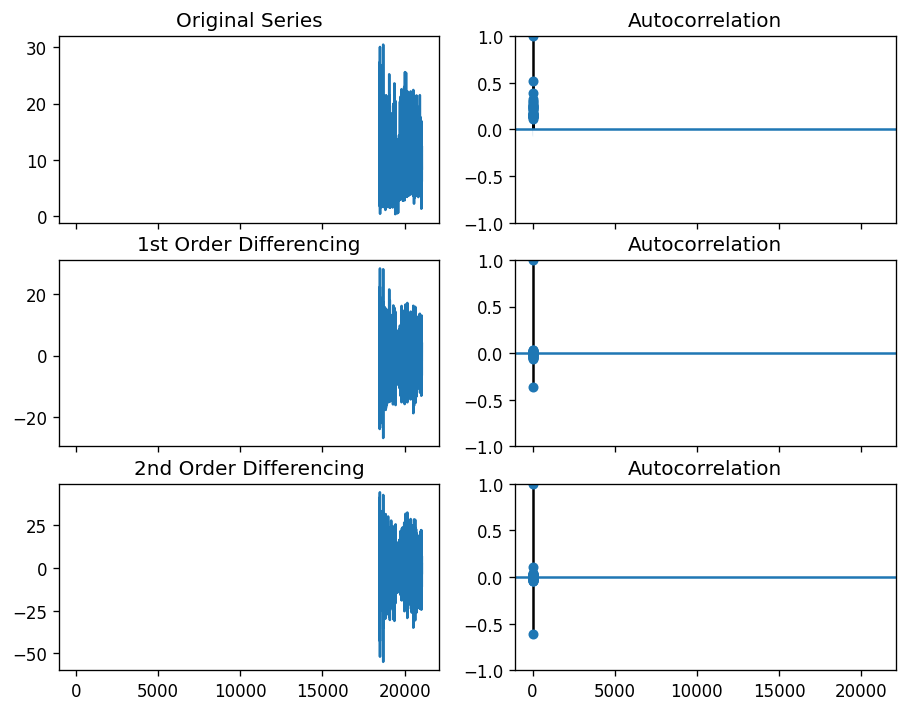

NotImplementedError: ignored

In [38]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm
import matplotlib.pyplot as plt
#from statsmodels.tsa.arima_model import auto_arima

plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

i=1
for loc in unique_locations:
    loc_df = dataset2.loc[dataset2['Location'] == loc]
    arima_data= loc_df[['New_Date','PolyPwr']]
    arima_data=prophet_data.rename(columns={"New_Date": "ds", "PolyPwr": "y"})
    # Create Training and Test
    train = arima_data.y[:500]
    test = arima_data.y[500:]
    print(i,"",loc)
    # Original Series
    fig, axes = plt.subplots(3, 2, sharex=True)
    axes[0, 0].plot(arima_data.y); axes[0, 0].set_title('Original Series')
    plot_acf(arima_data.y, ax=axes[0, 1])

    # 1st Differencing
    axes[1, 0].plot(arima_data.y.diff()); axes[1, 0].set_title('1st Order Differencing')
    plot_acf(arima_data.y.diff().dropna(), ax=axes[1, 1])

    # 2nd Differencing
    axes[2, 0].plot(arima_data.y.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
    plot_acf(arima_data.y.diff().diff().dropna(), ax=axes[2, 1])

    plt.show()


    # 1,1,2 ARIMA Model
    '''model = pm.auto_arima(arima_data.y.dropna(),start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)'''
    
    model = ARIMA(arima_data.y.dropna(), order=(1, 1, 1))  
    model_fit = model.fit(disp=0)
    print(model_fit.summary())
    fitted = model.fit(disp=-1)  

    # Forecast
    fc, se, conf = fitted.forecast(2761, alpha=0.05)  # 95% conf

    # Make as pandas series
    fc_series = pd.Series(fc, index=test.index)
    lower_series = pd.Series(conf[:, 0], index=test.index)
    upper_series = pd.Series(conf[:, 1], index=test.index)

    # Plot
    plt.figure(figsize=(12,5), dpi=100)
    plt.plot(train, label='training')
    plt.plot(test, label='actual')
    plt.plot(fc_series, label='forecast')
    plt.fill_between(lower_series.index, lower_series, upper_series, 
                    color='k', alpha=.15)
    plt.title('Forecast vs Actuals')
    plt.legend(loc='upper left', fontsize=8)

    print("********************************")
    i=i+1

In [ ]:
from fbprophet.diagnostics import cross_validation, performance_metrics
df_cv = cross_validation(m, horizon='90 days')
df_p = performance_metrics(df_cv)
df_p.head(5)

INFO:fbprophet:Making 1 forecasts with cutoffs between 2019-07-03 00:00:00 and 2019-07-03 00:00:00


,horizon,mse,rmse,mae,mape,coverage
0,8 days 23:00:00,23.844030,4.883035,4.550828,0.368894,0.725581
1,9 days 00:00:00,24.367138,4.936308,4.587419,0.375228,0.720930
2,9 days 01:00:00,24.842133,4.984188,4.620225,0.380866,0.716279
3,9 days 02:00:00,25.317294,5.031629,4.652099,0.386621,0.711628
4,9 days 03:00:00,25.685301,5.068067,4.678493,0.390679,0.706977
